In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%cd /content/drive/MyDrive/sia/format

/content/drive/MyDrive/sia/format


# Module load

In [ ]:
!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html
# If there is not yet a detectron2 release that matches the given torch + CUDA version, you need to install a different pytorch.

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

     |████████████████████████████████| 274 kB 9.7 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=1c398071950e255730e00d1d6dc94b94141a5336f2c8ff670090ad3b60b8edec
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
torch:  1.10 ; cuda:  cu111
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.10/index.html
     |████████████████████████████████| 7.0 MB 7.4 MB/s 
     |████████████████████████████████| 130 kB 9.8 MB/s 
     |████████████████████████████████| 49 kB 7.9 MB/s 
     |████████████████████████████████| 145 kB 41.0 MB/s 
     |████████████████████████████████| 74 kB 4.2 MB/s 
     |████████████████████████████████| 749 kB 57.1 MB/s 
     |████████████████████████████████

In [ ]:
%cd /content/drive/MyDrive/sia/format

/content/drive/MyDrive/sia/format


In [ ]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import matplotlib.pyplot as plt
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
# coco 데이터셋에 sia 객체 instance를 추가해준다.
from detectron2.data.datasets import register_coco_instances
register_coco_instances("sia", {}, "/content/drive/MyDrive/sia/format/Objects/train/traincoco_all_re2.json", "/content/drive/MyDrive/sia/format/Objects/train/image")
sia_metadata = MetadataCatalog.get("sia")
dataset_dicts = DatasetCatalog.get("sia")

[12/04 02:27:46 d2.data.datasets.coco]: Loading /content/drive/MyDrive/sia/format/Objects/train/traincoco_all_re2.json takes 6.27 seconds.
[12/04 02:27:46 d2.data.datasets.coco]: Loaded 1748 images in COCO format from /content/drive/MyDrive/sia/format/Objects/train/traincoco_all_re2.json


# 학습된 모델 가져오기

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

num_gpu = 1
bs = (num_gpu * 2)

cfg = get_cfg()
cfg.merge_from_file("/content/drive/MyDrive/sia/format/detectron2_repo/configs/COCO-Detection/retinanet_R_101_FPN_3x.yaml")
cfg.DATASETS.TRAIN = ("sia",)
cfg.DATASETS.TEST = ()   # no metrics implemented for this dataset
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = "detectron2://COCO-Detection/retinanet_R_101_FPN_3x/190397697/model_final_971ab9.pkl"  # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  
cfg.SOLVER.BASE_LR = 0.02 * bs / 16
cfg.SOLVER.MAX_ITER = 1000
cfg.SOLVER.GAMMA = 0.05
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64   
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 22  # 21 classes

Loading config /content/drive/MyDrive/sia/format/detectron2_repo/configs/COCO-Detection/../Base-RetinaNet.yaml with yaml.unsafe_load. Your machine may be at risk if the file contains malicious content.


# Making Prediction

In [ ]:
# predictor 명시
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
cfg.MODEL.WEIGHTS = "/content/drive/MyDrive/sia/format/output/model_final.pth"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.55   # set the testing threshold for this model
cfg.DATASETS.TEST = ("sia", )
predictor = DefaultPredictor(cfg)

# images detection

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


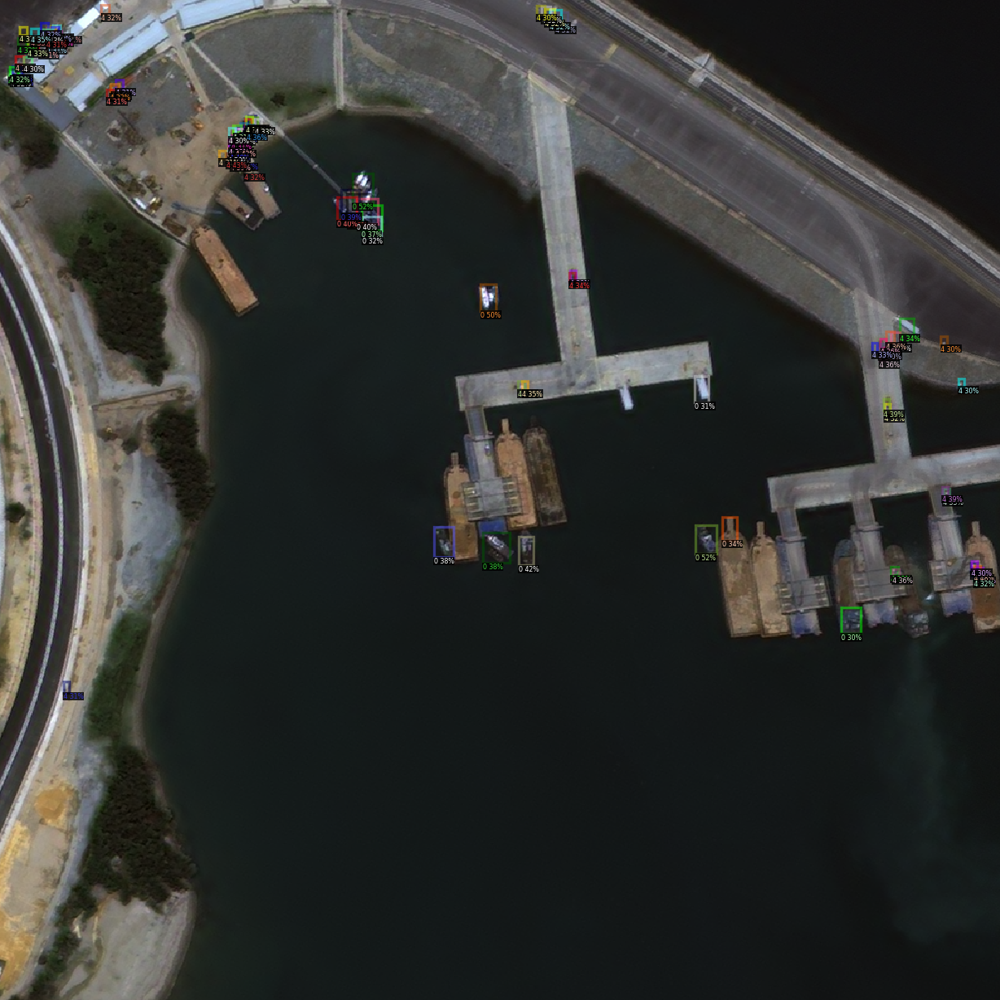

In [ ]:
path = "/content/drive/MyDrive/sia/format/Objects/train/image/OBJ01735_PS3_K3_NIA0104.png"

im = cv2.imread(path)
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


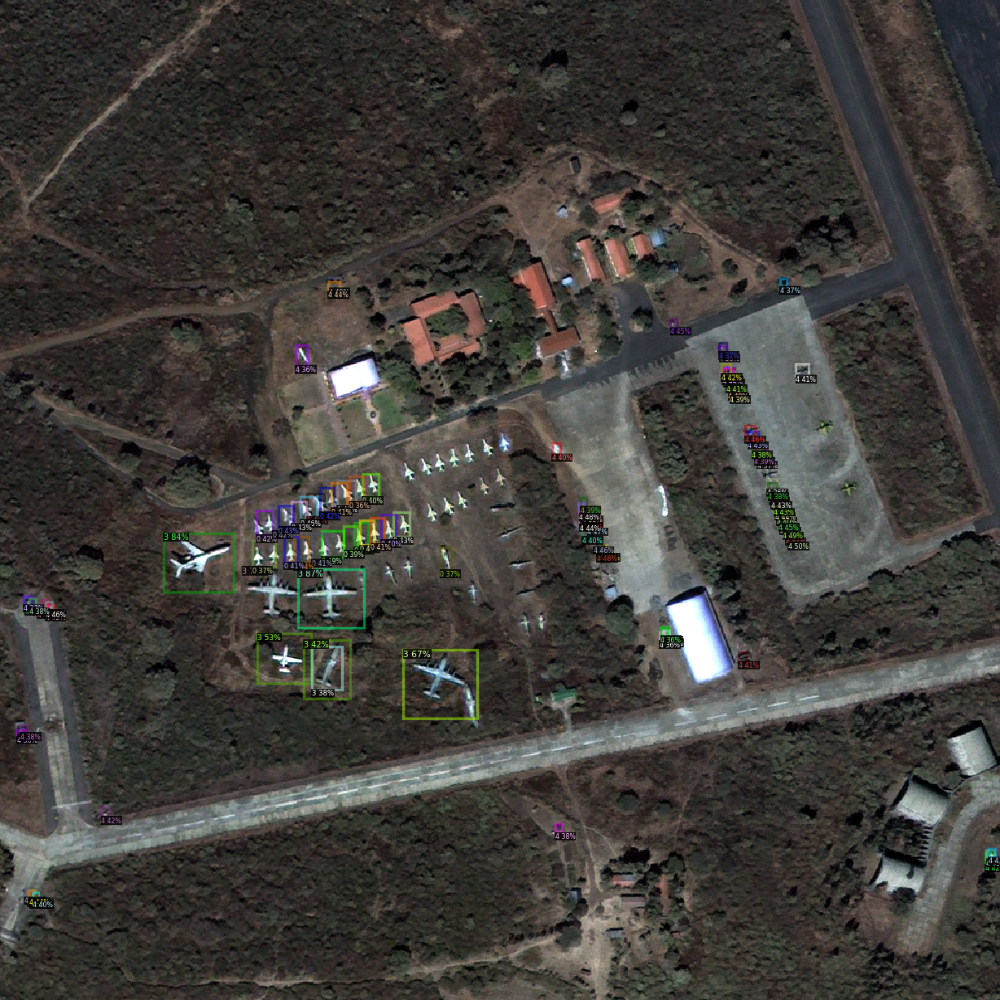

In [ ]:
path = "/content/drive/MyDrive/sia/format/Objects/train/image/OBJ02457_PS3_K3_NIA0123.png"

im = cv2.imread(path)
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


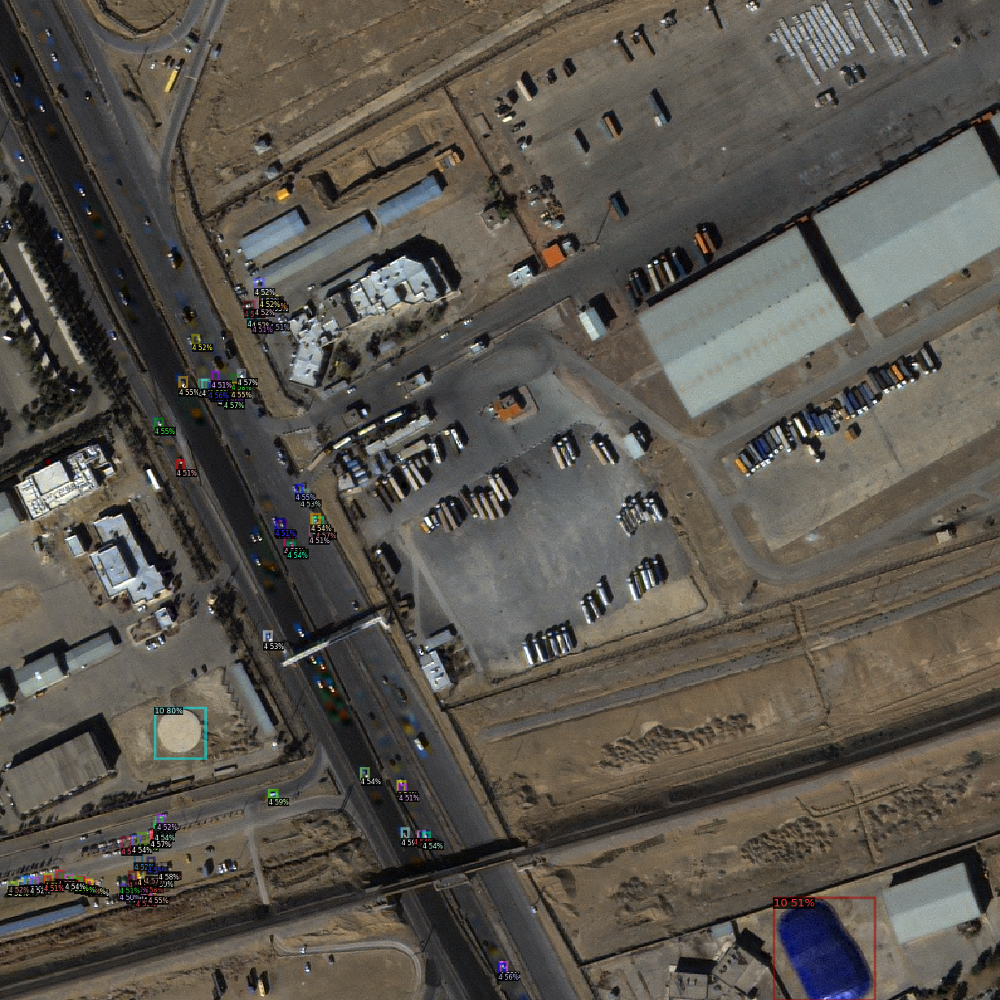

In [ ]:
path = "/content/drive/MyDrive/sia/format/Objects/train/image/OBJ03368_PS3_K3A_NIA0137.png"

im = cv2.imread(path)
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

# RBOX 저장
https://junha1125.tistory.com/45 참고

In [ ]:
# output 정보 확인
print(outputs['instances'].image_size)
print(list(outputs['instances'].get_fields().keys()))

(1024, 1024)
['pred_boxes', 'scores', 'pred_classes']


# CSV로 저장

In [ ]:
from detectron2.utils.visualizer import ColorMode

im = cv2.imread("/content/drive/MyDrive/sia/format/Objects/train/image/OBJ03368_PS3_K3A_NIA0137.png")

print('------------------------ 1 ------------------------')
print(outputs['instances'].image_size)

print('------------------------ 2 ------------------------')
print(outputs['instances'].get_fields().keys())

print('------------------- 2.1 pred_boxes ----------------')
print(outputs['instances'].get_fields()['pred_boxes'])

print('------------------- 2.2 scores --------------------')
print(outputs['instances'].get_fields()['scores'])

print('------------------- 2.3 pred_classes ---------------')
print(outputs['instances'].get_fields()['pred_classes'])

------------------------ 1 ------------------------
(1024, 1024)
------------------------ 2 ------------------------
dict_keys(['pred_boxes', 'scores', 'pred_classes'])
------------------- 2.1 pred_boxes ----------------
Boxes(tensor([[ 158.1889,  724.5318,  209.9381,  776.5453],
        [ 217.7921,  394.8039,  225.0540,  404.3188],
        [ 410.7224,  847.9451,  417.8979,  858.8298],
        [ 229.9274,  398.0895,  237.1233,  407.1273],
        [ 274.9860,  809.0558,  283.0378,  817.7199],
        [ 427.2791,  850.5168,  434.2659,  860.6116],
        [ 223.4245,  399.4587,  230.8651,  408.7303],
        [ 156.8133,  892.5456,  163.8566,  901.8747],
        [ 154.7825,  850.0918,  163.4381,  859.7035],
        [ 320.2927,  529.7443,  330.0419,  541.5088],
        [ 162.3090,  884.8090,  169.0066,  893.9702],
        [ 214.4314,  389.7781,  221.4086,  399.5011],
        [ 236.6427,  383.8417,  243.7971,  393.5693],
        [ 146.2724,  897.2415,  153.6309,  907.1437],
        [ 229.534

----------------------- 3 -------------------------


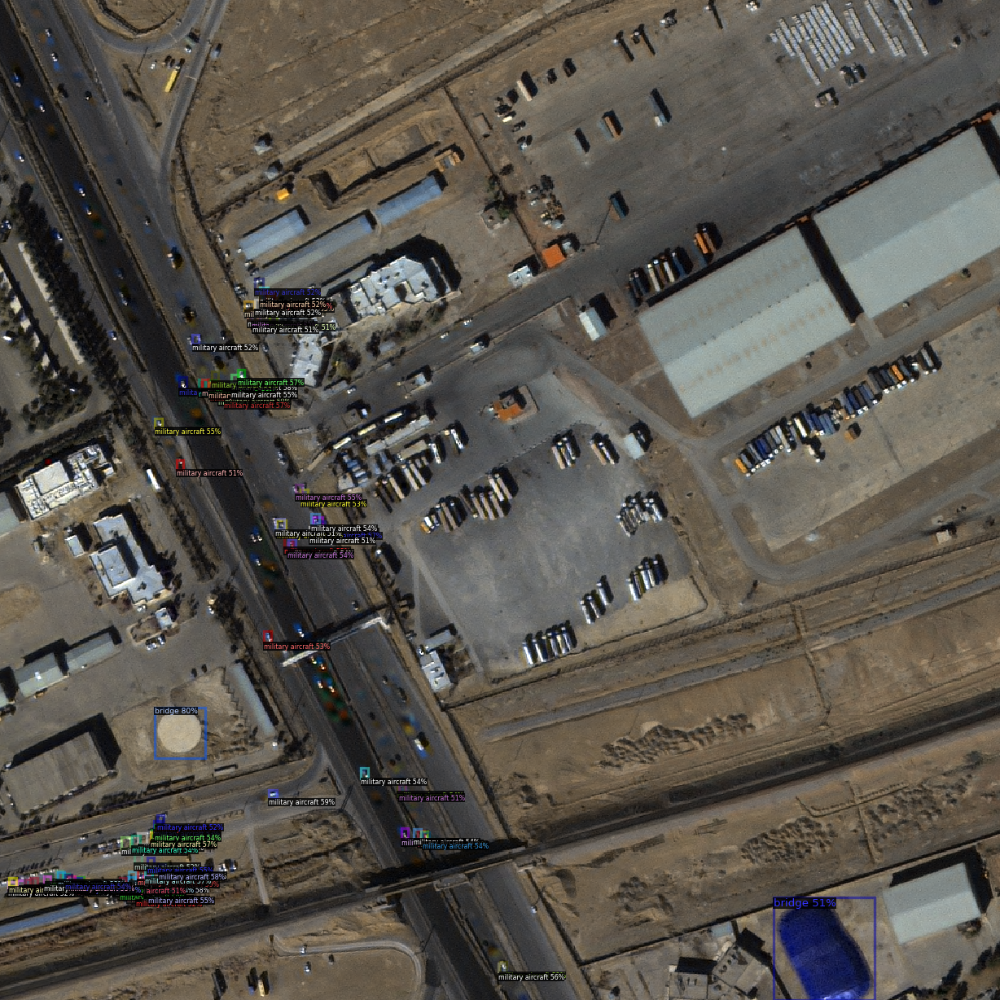

In [ ]:
print('----------------------- 3 -------------------------')
v = Visualizer(im[:, :, ::-1],
               metadata=sia_metadata,
               scale=1.2
)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

In [ ]:
import csv
with open('/content/drive/MyDrive/sia/format/detectron_sia_0.1', 'w', newline='') as f:
  writer = cvs.writer(f)
  writer = writerows(objs_info_images)